In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py

In [2]:
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))
flow = flow_ons.data.combine_first(flow_sar.data["D19086"].to_frame())
flow = Flow(data=flow)

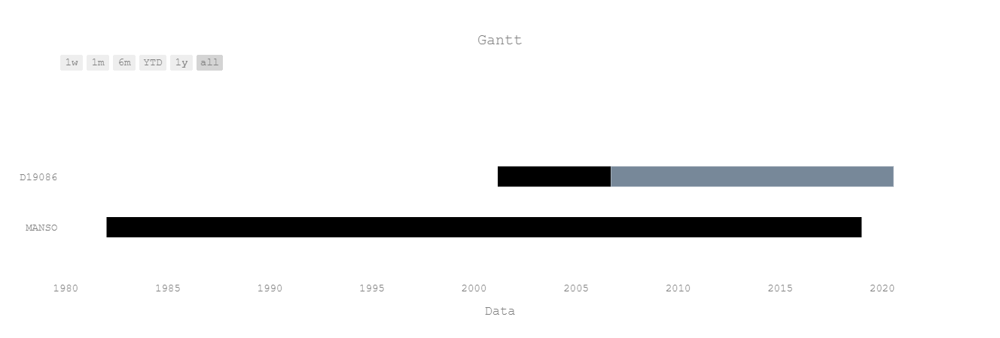

In [3]:
fig_gantt, data_gantt = flow.gantt("Gantt")
py.offline.iplot(fig_gantt)

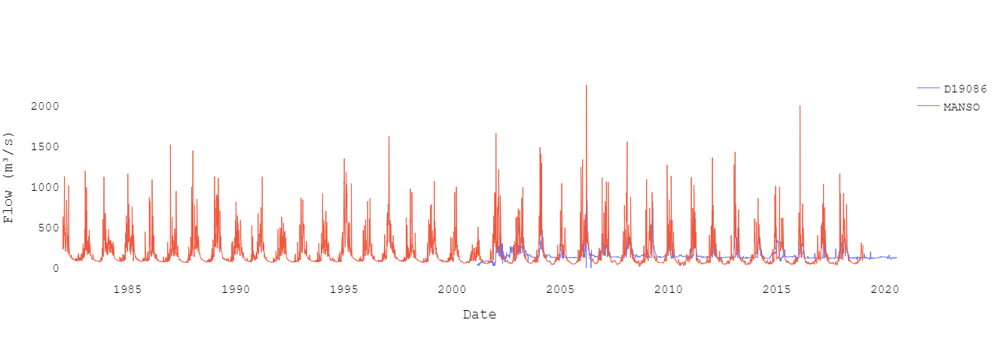

In [4]:
fig_hidro, data_hidro = flow.hydrogram("")
py.offline.iplot(fig_hidro)

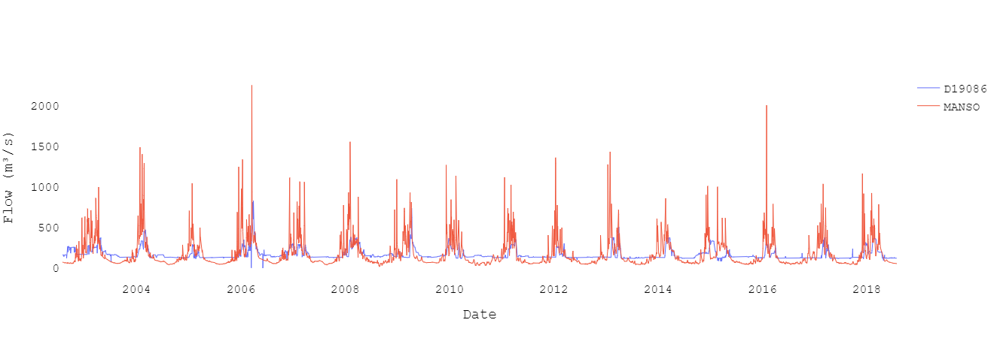

In [5]:
start_filling = "01/08/2002"
end_filling = "31/07/2018"
flow.date(date_start=start_filling, date_end=end_filling)
fig_start_filling_hydro, data_start_filling_hydro = flow.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

## Interpolar dados

In [6]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))

In [7]:
nulls = flow.data["D19086"].isnull()
date_start = flow.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow.data.loc[nulls].index[-1]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow.data["D19086"][date] = flow_ana.data["66231000"][date] + delta
    delta = flow.data["D19086"][date] - flow_ana.data["66231000"][date]

In [8]:
zeros = flow.data.loc[flow.data["D19086"]==0].index

for date in zeros:
    flow.data["D19086"][date] = flow_ana.data["66231000"][date]

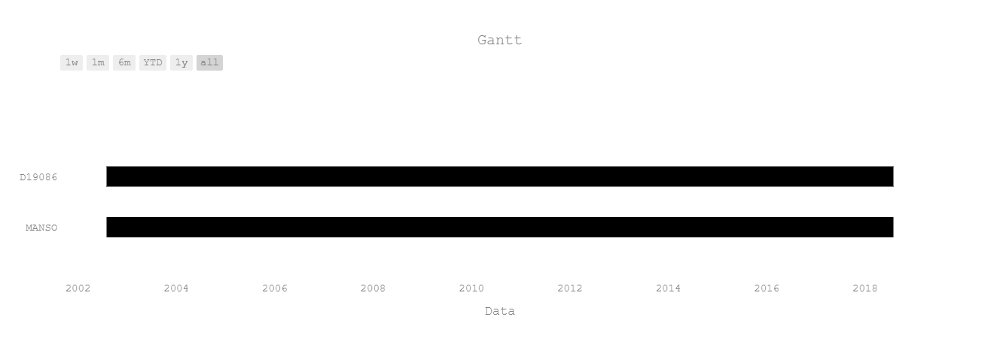

In [9]:
fig_gantt_2, data_gantt_2 = flow.gantt("Gantt")
py.offline.iplot(fig_gantt_2)

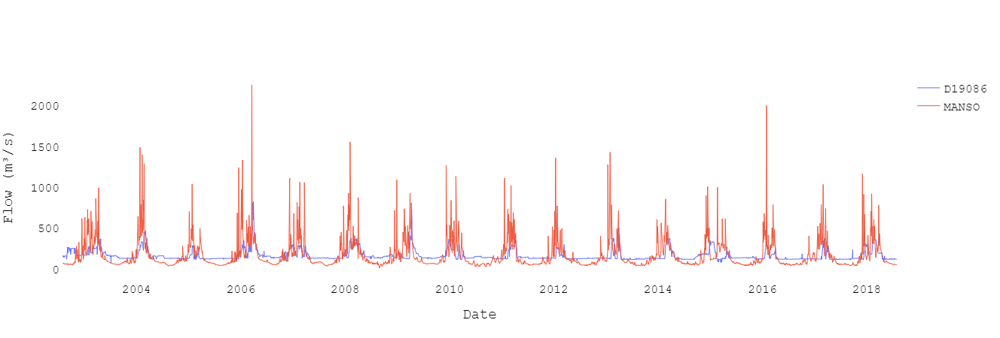

In [10]:
fig_start_filling_hydro, data_start_filling_hydro = flow.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

Variables:

Magnitude:
- 1-day maximum
- 1-day minimum

Duration:
- High pulse duration
- Low pulse duration

Frequency:
- High pulse count
- Low pulse count

Timing:
- Date of maximum
- Date of minimum

# Control x Impact

In [11]:
 # q90
threshold_high = flow_ons.quantile(0.75)[0]
f"Threshold high: {threshold_high}"

'Threshold high: 213.0'

In [12]:
# q10
threshold_low = flow_ons.quantile(0.25)[0]
f"Threshold low: {threshold_low}"

'Threshold low: 78.0'

In [13]:
flow_ons.date(date_start=start_filling, date_end=end_filling)

## Manso

In [14]:
iha_pre = flow_ons.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [15]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,473.133300,1224.865882
1-day minimum,10.557641,38.274118
High pulse count,3.662979,2.837838
High pulse duration,5.399534,15.137090
Low pulse count,3.199099,2.351351
Low pulse duration,16.466024,26.150521
Date of maximum,143.366252,142.588235
Date of minimum,26.553636,243.705882


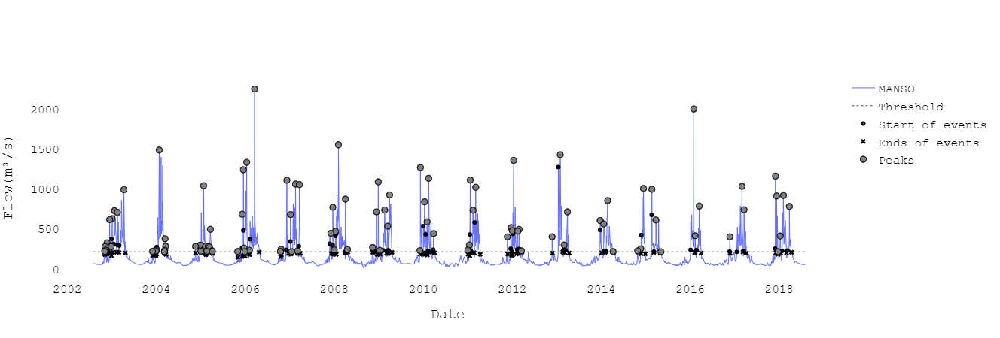

In [16]:
fig_events_high, data_events_high = iha_pre.frequency_and_duration.events_high().plot_hydrogram("")
py.offline.iplot(fig_events_high)

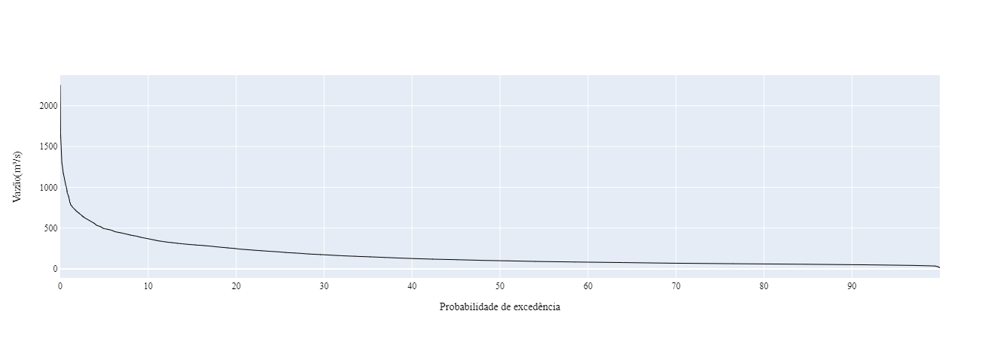

In [17]:
fig, data = flow_ons.rating_curve()
py.offline.iplot(fig)

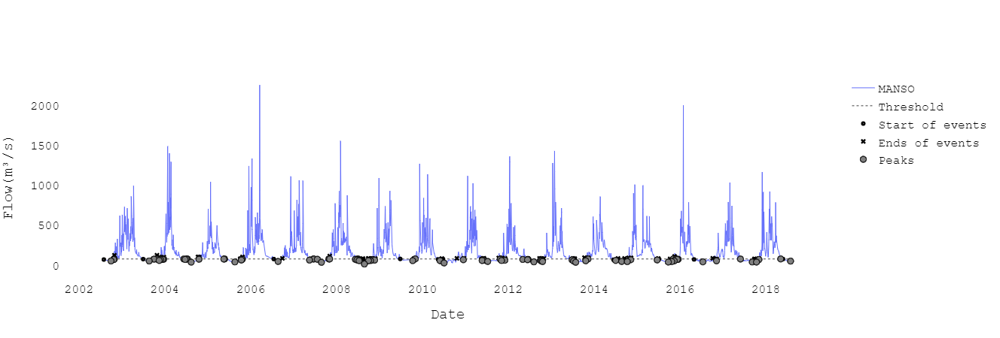

In [18]:
fig_events_low, data_events_low = iha_pre.frequency_and_duration.events_low().plot_hydrogram("")
py.offline.iplot(fig_events_low)

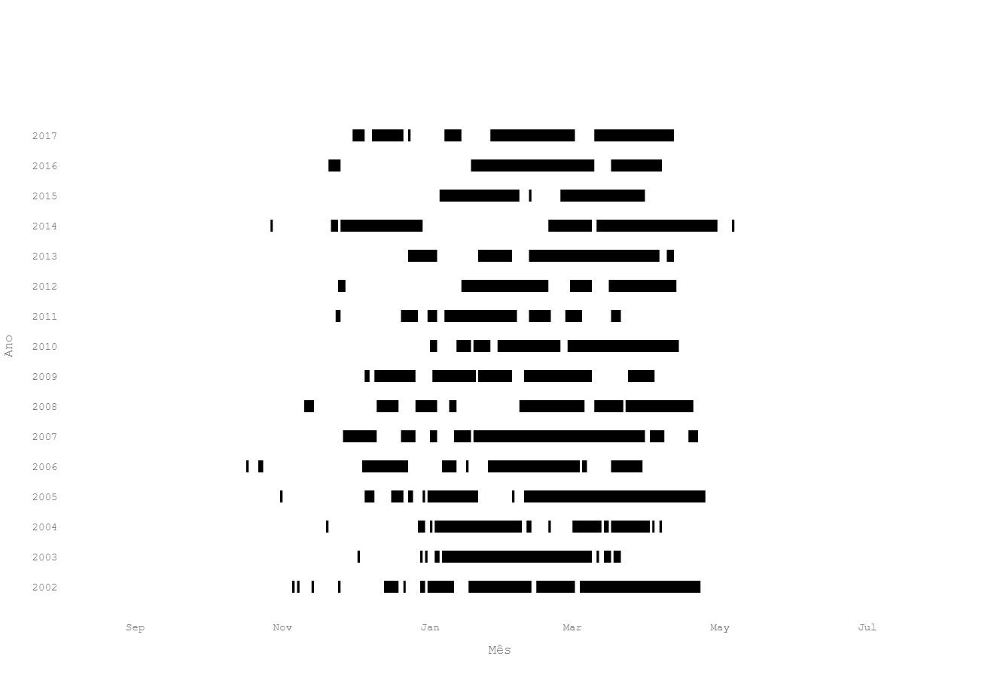

In [19]:
fig_events_high_spells, data_events_high_spells = iha_pre.frequency_and_duration.events_high().plot_spells("")
py.offline.iplot(fig_events_high_spells)

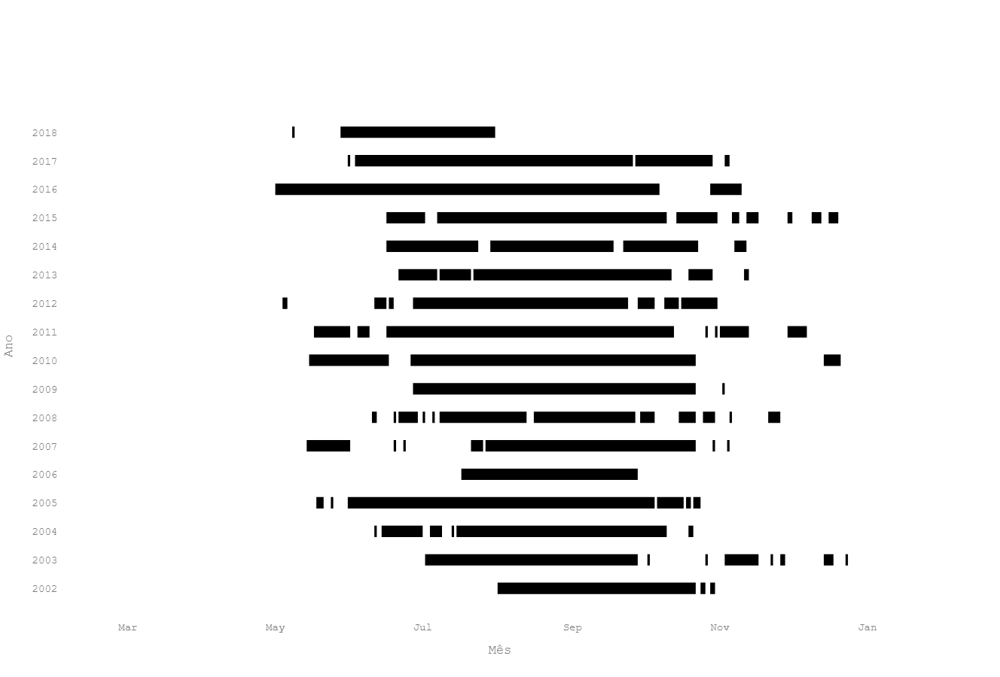

In [20]:
fig_events_low_spells, data_events_low_spells = iha_pre.frequency_and_duration.events_low().plot_spells("")
py.offline.iplot(fig_events_low_spells)

# Observado

In [21]:
flow_sar = Flow(data=flow.data["D19086"].to_frame())

In [22]:
iha_pos = flow_sar.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [23]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,161.277688,399.647059
1-day minimum,15.243369,107.882353
High pulse count,2.821790,3.312500
High pulse duration,18.055738,24.206250
Low pulse count,0.250000,0.062500
Low pulse duration,NaN,1.000000
Date of maximum,105.969300,109.647059
Date of minimum,98.051795,181.823529


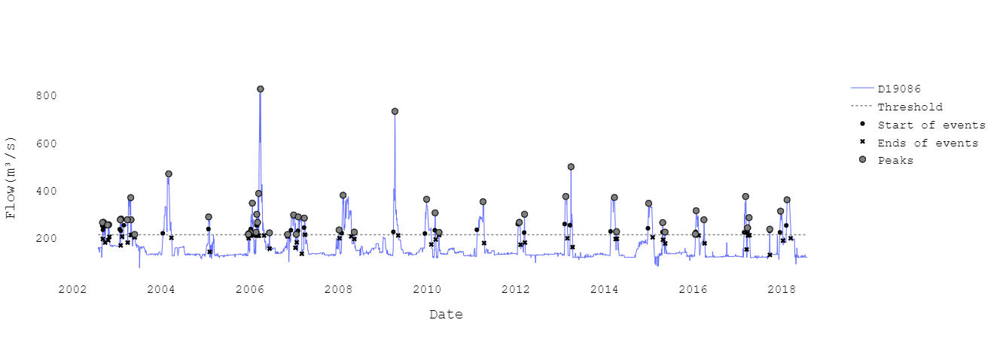

In [24]:
fig_events_high_pos, data_events_high_pos = iha_pos.frequency_and_duration.events_high().plot_hydrogram("")
py.offline.iplot(fig_events_high_pos)

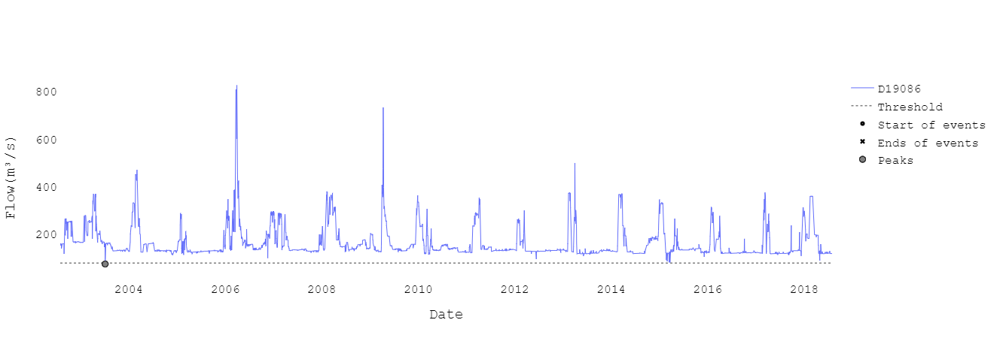

In [25]:
fig_events_low_pos, data_events_low_pos = iha_pos.frequency_and_duration.events_low().plot_hydrogram("")
py.offline.iplot(fig_events_low_pos)

e:\projetos\hidrocomp\venv\lib\site-packages\hidrocomp\graphics\gantt.py:42: RuntimeWarning:

invalid value encountered in double_scalars



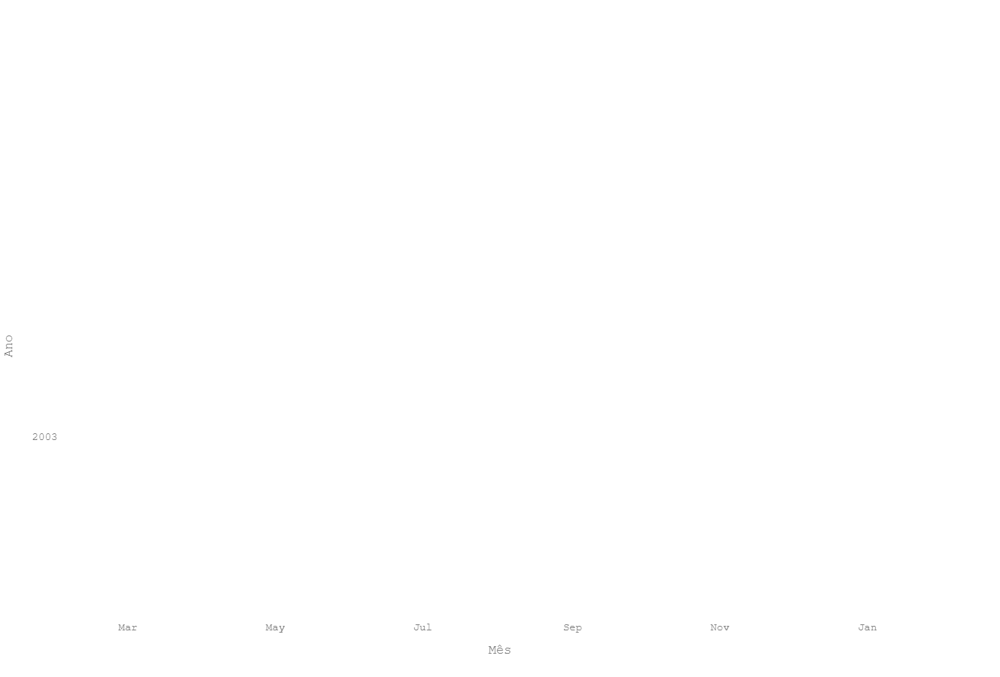

In [26]:
fig_events_low_spells_pos, data_events_low_spells_pos = iha_pos.frequency_and_duration.events_low().plot_spells("")
py.offline.iplot(fig_events_low_spells_pos)

In [27]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.frequency_and_duration.events_high().plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.frequency_and_duration.events_high().plot_polar(title="Events High", color="#00008B")

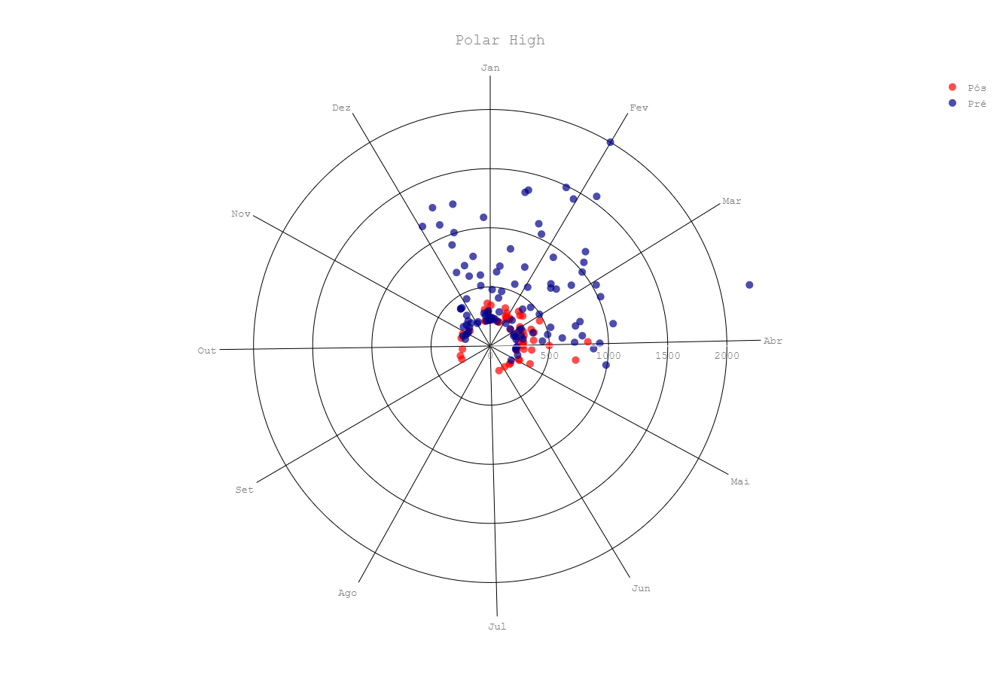

In [28]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

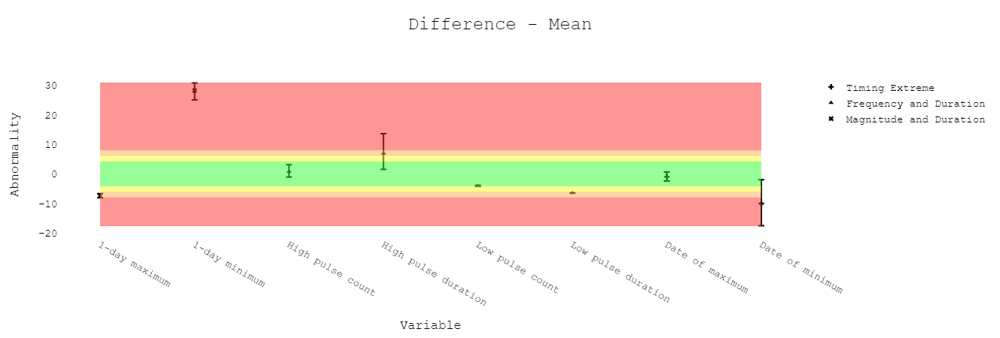

In [29]:
cha = iha_pre.cha(iha_obs=iha_pos)
fig, data = cha.plot(data_type="mean")
py.offline.iplot(fig)